# Find the central star of CTIO Data in May 2017
==================================================================================================

- author : Jérémy Neveu
- date   : May 31st 2017


The goal of this notebook is to cut a part of the image around the main central star.
The rest of the image is useless.
This region around the central star is necessary to perform the rotation of the images without
any biases due to other stars.


In [7]:
%%javascript
var kernel = IPython.notebook.kernel;
var thename = window.document.getElementById("notebook_name").innerHTML;
var command = "theNotebook = " + "'"+thename+"'";
kernel.execute(command);

<IPython.core.display.Javascript object>

In [8]:
print theNotebook

FindCentralStar


In [9]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np

from astropy.modeling import models
from astropy import units as u
from astropy import nddata
from astropy.io import fits
import re
import os

In [10]:
import ccdproc
print 'ccdproc version',ccdproc.__version__

from astropy.modeling import models

ccdproc version 1.2.0


In [11]:
from scipy import stats  
from scipy import ndimage
from datetime import datetime, timedelta
from mpl_toolkits.mplot3d import Axes3D
import scipy.signal

In [12]:
import bottleneck as bn  # numpy's masked median is slow...really slow (in version 1.8.1 and lower)
print 'bottleneck version',bn.__version__

bottleneck version 1.2.0


In [13]:
import photutils
from astropy.stats import sigma_clipped_stats
from photutils import daofind
from photutils import CircularAperture
from astropy.visualization import SqrtStretch
from astropy.visualization.mpl_normalize import ImageNormalize
#from photutils.background import Background2D
from photutils import Background2D, SigmaClip, MedianBackground

In [14]:
%load_ext Cython

In [15]:
from IPython.display import Image, display

In [16]:
import matplotlib
matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 

In [17]:
# to enlarge the sizes
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (4, 4),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
plt.rcParams.update(params)

In [18]:
############################################################################
def ensure_dir(f):
    d = os.path.dirname(f)
    if not os.path.exists(f):
        os.makedirs(f)
#########################################################################

### Output directory for images generated in the notebook view (not true fits images)¶

In [19]:
dir_top_images="images_notebooks/"+theNotebook ### Top directory to save images

In [20]:
ensure_dir(dir_top_images) # create that directory

### Input directory

In [21]:
!ls ../OverScanRemove/trim_images

trim_20170609_004.fits trim_20170609_114.fits trim_20170609_231.fits
trim_20170609_005.fits trim_20170609_115.fits trim_20170609_232.fits
trim_20170609_006.fits trim_20170609_116.fits trim_20170609_233.fits
trim_20170609_007.fits trim_20170609_117.fits trim_20170609_234.fits
trim_20170609_008.fits trim_20170609_118.fits trim_20170609_235.fits
trim_20170609_009.fits trim_20170609_119.fits trim_20170609_236.fits
trim_20170609_010.fits trim_20170609_120.fits trim_20170609_237.fits
trim_20170609_011.fits trim_20170609_121.fits trim_20170609_238.fits
trim_20170609_012.fits trim_20170609_122.fits trim_20170609_239.fits
trim_20170609_013.fits trim_20170609_123.fits trim_20170609_240.fits
trim_20170609_014.fits trim_20170609_124.fits trim_20170609_241.fits
trim_20170609_015.fits trim_20170609_125.fits trim_20170609_242.fits
trim_20170609_016.fits trim_20170609_126.fits trim_20170609_243.fits
trim_20170609_017.fits trim_20170609_127.fits trim_20170609_244.fits
trim_20170609_018.fits trim_201706

In [22]:
inputdir="../OverScanRemove/trim_images"
MIN_IMGNUMBER=183
MAX_IMGNUMBER=207
object_name='HD205905'
SelectTagRe='^trim_20170609_([0-9]+).fits$' # regular expression to select the file
SearchTagRe='^trim_20170609_[0-9]+.fits$'
NBIMGPERLROW=4

### Output directory fot fits images

In [23]:
outputdir="./cut_fitsimages"

In [24]:
ensure_dir(outputdir)

## Location of corrected images
----------------------------------

In [25]:
input_filelist=os.listdir(inputdir) 

In [26]:
if '.DS_Store' in input_filelist:
    input_filelist.remove('.DS_Store')
input_filelist=np.array(input_filelist)

In [27]:
print input_filelist[:5]

['trim_20170609_004.fits' 'trim_20170609_005.fits' 'trim_20170609_006.fits'
 'trim_20170609_007.fits' 'trim_20170609_008.fits']


In [28]:
indexes_files= [] # global list
filelist_fitsimages= []  # global list
dirlist_all = [inputdir]

In [29]:
def MakeFileList():
    """
    MakeFileList : Make The List of files to open
    =============
    
    - we select the files which are of interest.
    - In particular select the number range
    
    """
    count=0
    
    for dir in dirlist_all: # loop on directories, one per image   (if necessary)    
            dir_leaf= dir # build the name of leaf directory
            listfiles=os.listdir(dir_leaf) 
            for filename in listfiles:
                if re.search(SearchTagRe,filename):  #example of filename filter
                    str_index=re.findall(SelectTagRe,filename)
                    count=count+1
                    index=int(str_index[0])
                    if index >= MIN_IMGNUMBER and index <= MAX_IMGNUMBER: 
                        indexes_files.append(index)         
                        shortfilename=dir_leaf+'/'+filename
                        filelist_fitsimages.append(shortfilename)
                    
    return 

In [30]:
MakeFileList()   # Make the list

In [31]:
indexes_files=np.array(indexes_files)
filelist_fitsimages=np.array(filelist_fitsimages)

In [32]:
sorted_indexes=np.argsort(indexes_files) # sort the file indexes

In [33]:
sorted_numbers=indexes_files[sorted_indexes]

In [34]:
#sorted_files= [filelist_fitsimages[index] for index in sorted_indexes] # sort files
sorted_files=filelist_fitsimages[sorted_indexes]

## Build full filename
----------------------------

In [35]:
sorted_filenames=[]
for file in sorted_files:
    #fullfilename=os.path.join(inputdir,file)
    fullfilename=file
    sorted_filenames.append(fullfilename)

In [36]:
#sorted_filenames=np.array(sorted_filenames)
sorted_filenames=np.copy(sorted_files)

## Acces to data of  images
----------------------------------

In [37]:
all_dates = []
all_airmass = []
all_images = []
all_titles = []
all_header = []
all_img = []
all_filt = []

In [38]:
%%cython

import numpy as np
from astropy.io import fits

def BuildImages(sorted_filenames,sorted_numbers,object_name):
    """
    BuildRawImages
    ===============
    """

    
    all_dates = []
    all_airmass = []
    all_images = []
    all_titles = []
    all_header = []
    all_filt = []
   
    NBFILES=sorted_filenames.shape[0]

    for idx in range(NBFILES):  
        
        file=sorted_filenames[idx]    
        
        hdu_list=fits.open(file)
        header=hdu_list[0].header
        #print header
        date_obs = header['DATE-OBS']
        airmass = header['AIRMASS']
        filters = header['FILTERS']
    
        num=sorted_numbers[idx]
        title=object_name+" z= {:3.2f} Nb={}".format(float(airmass),num)
        image_corr=hdu_list[0].data
        image=image_corr
        
        all_dates.append(date_obs)
        all_airmass.append(float(airmass))
        all_images.append(image)
        all_titles.append(title)
        all_header.append(header)
        all_filt.append(filters)
        hdu_list.close()
        
    return all_dates,all_airmass,all_images,all_titles,all_header,all_filt

In [39]:
all_dates,all_airmass,all_images,all_titles,all_header,all_filt=BuildImages(sorted_files,sorted_numbers,object_name)

In [40]:
#all_filt

## Show images
-----------------------

In [41]:
len(all_images)

25

In [42]:
def ShowRawImages():
    """
    ShowRawImages: Show the raw images without background subtraction
    ==============
    """
    #global all_images
    #global all_titles
    #global object_name

    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/NBIMGPERLROW)+1

    f, axarr = plt.subplots(MAXIMGROW,NBIMGPERLROW,figsize=(25,5*MAXIMGROW))
    for index in np.arange(0,NBIMAGES):
        ix=index%NBIMGPERLROW
        iy=index/NBIMGPERLROW
        #im=axarr[iy,ix].imshow(all_images[index],origin='lower',cmap='rainbow',norm=LogNorm(vmin=0.1, vmax=10))
        im=axarr[iy,ix].imshow(all_images[index],origin='lower',cmap='rainbow',vmin=0, vmax=20)
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(color='white', ls='solid')
        axarr[iy,ix].text(1000.,1700,all_filt[index],verticalalignment='bottom', horizontalalignment='center',color='yellow', fontweight='bold',fontsize=16)
    title='Raw images of {}'.format(object_name)
    plt.suptitle(title,size=16)    
    figfilename=os.path.join(dir_top_images,'input_images.pdf')
    plt.savefig(figfilename)   

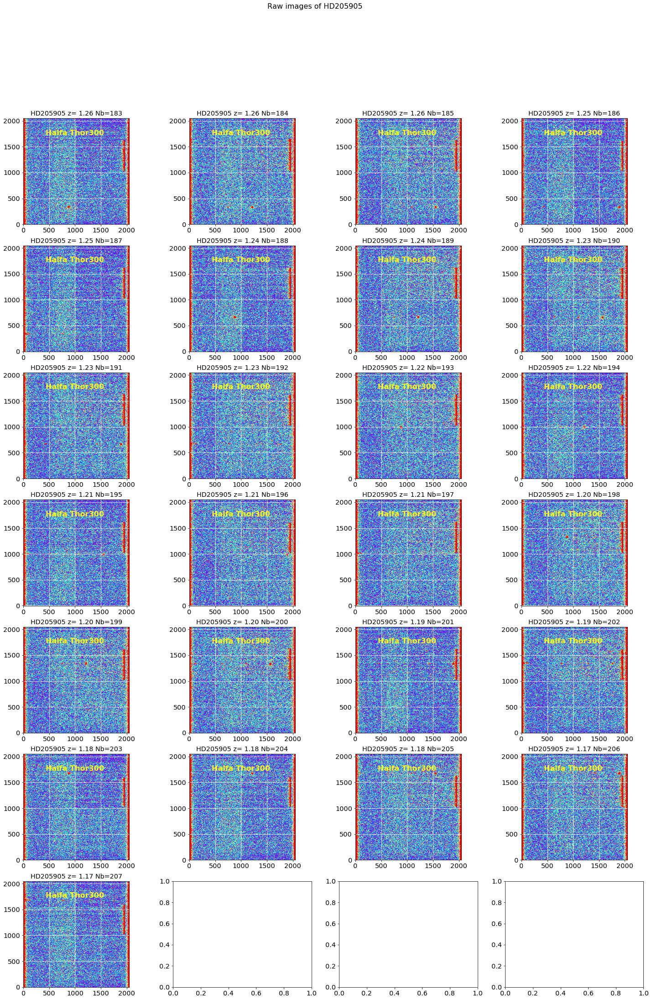

In [43]:
ShowRawImages()

### Find the star locations
----------------------------

In [44]:
%%cython
import photutils
from astropy.stats import sigma_clipped_stats
from photutils import daofind

def ComputeStatImages(all_images):
    """
    ComputeStatImages: 
    ==============
    """
    
    img_mean=[]
    img_median=[]
    img_std=[]
    img_sources=[]
    img_=[]
    index=0
    for image in all_images:
        mean, median, std = sigma_clipped_stats(image, sigma=10.0, iters=5)    
        print '----------------------------------------------------------------'
        print index,' mean, median, std = ',mean, median, std
        img_mean.append(mean)
        img_median.append(median)
        img_std.append(std)
        sources = daofind(image - median, fwhm=30, threshold=10*std) # (JN) valeurs optimisées pour cette étude
        print sources
        img_sources.append(sources)    
        index+=1
    return img_mean,img_median,img_std,img_sources

In [45]:
#img_mean,img_median,img_std,img_sources=ComputeStatImages(all_images)

In [46]:
%%cython
import photutils
from astropy.stats import sigma_clipped_stats
from photutils import daofind
import numpy as np
import matplotlib.pyplot as plt

def ComputeStatImagesWithGuess(all_images,guess_positions):
    """
    ComputeStatImages: 
    ==============
    """
    w=200 # size of the window in pixel
    
    img_mean=[]
    img_median=[]
    img_std=[]
    x_star = []
    y_star = []
    img_=[]
    NBIMGPERLROW = 4
    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/NBIMGPERLROW)+1

    f, axarr = plt.subplots(MAXIMGROW,NBIMGPERLROW,figsize=(25,5*MAXIMGROW))
    for index in np.arange(0,NBIMAGES):
        ix=index%NBIMGPERLROW
        iy=index/NBIMGPERLROW
        xguess = guess_positions[index][1]
        yguess = guess_positions[index][0]
        sub = all_images[index][yguess-w:yguess+w,xguess-w:xguess+w]

        mean, median, std = sigma_clipped_stats(all_images[index], sigma=10.0, iters=5)    # (JN) valeurs optimisées pour cette étude
        print '----------------------------------------------------------------'
        print index,' mean, median, std = ',mean, median, std
        #img_mean.append(mean)
        #img_median.append(median)
        #img_std.append(std)
        sources = daofind(sub - median, fwhm=7, threshold=200*std) # (JN) valeurs optimisées pour cette étude
        print sources
        axarr[iy,ix].imshow(sub,origin='lower',cmap='rainbow',vmin=0, vmax=20)
        #axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(color='white', ls='solid')
        #axarr[iy,ix].text(1000.,1700,all_filt[index],verticalalignment='bottom', horizontalalignment='center',color='yellow', fontweight='bold',fontsize=16)
        max_loc = np.where(sub==np.max(sub))
        print 'Max localisation: ',max_loc[1],max_loc[0]
        #x_star.append()
        axarr[iy,ix].scatter(max_loc[1],max_loc[0],s=200,facecolor='red')
        #img_sources.append(sources)  
        x_star.append(sources[0]["xcentroid"]+xguess-w)
        y_star.append(sources[0]["ycentroid"]+yguess-w)
        axarr[iy,ix].scatter([sources[0]["xcentroid"]],[sources[0]["ycentroid"]],s=200,facecolor='black')
    x_star = np.array(x_star).astype(int)
    y_star = np.array(y_star).astype(int)
    plt.show()

    return img_mean,img_median,img_std,x_star, y_star

----------------------------------------------------------------
0  mean, median, std =  5.7161230664 5.0 8.7065181008
 id   xcentroid     ycentroid   ...   peak       flux          mag      
--- ------------- ------------- ... ------- ------------- --------------
  1 282.884074886 193.288543682 ... 19920.0 15.4861341231 -2.97485754076
Max localisation:  [283] [193]


        Use DAOStarFinder instead. [astropy.utils.decorators]


----------------------------------------------------------------
1  mean, median, std =  6.40135115661 6.0 8.77754775796
 id   xcentroid    ycentroid   ...   peak       flux          mag      
--- ------------- ------------ ... ------- ------------- --------------
  1 282.755162616 195.41731115 ... 20246.0 15.5562692465 -2.97976362818
Max localisation:  [283] [195]
----------------------------------------------------------------
2  mean, median, std =  6.2230261213 5.0 8.79361521396
 id   xcentroid     ycentroid   ...   peak       flux          mag      
--- ------------- ------------- ... ------- ------------- --------------
  1 284.568060254 194.540885641 ... 14743.0 13.5955203989 -2.83348958958
Max localisation:  [285] [195]
----------------------------------------------------------------
3  mean, median, std =  5.33715268474 5.0 8.71657643357
 id   xcentroid     ycentroid   ...   peak       flux          mag      
--- ------------- ------------- ... ------- ------------- ----------

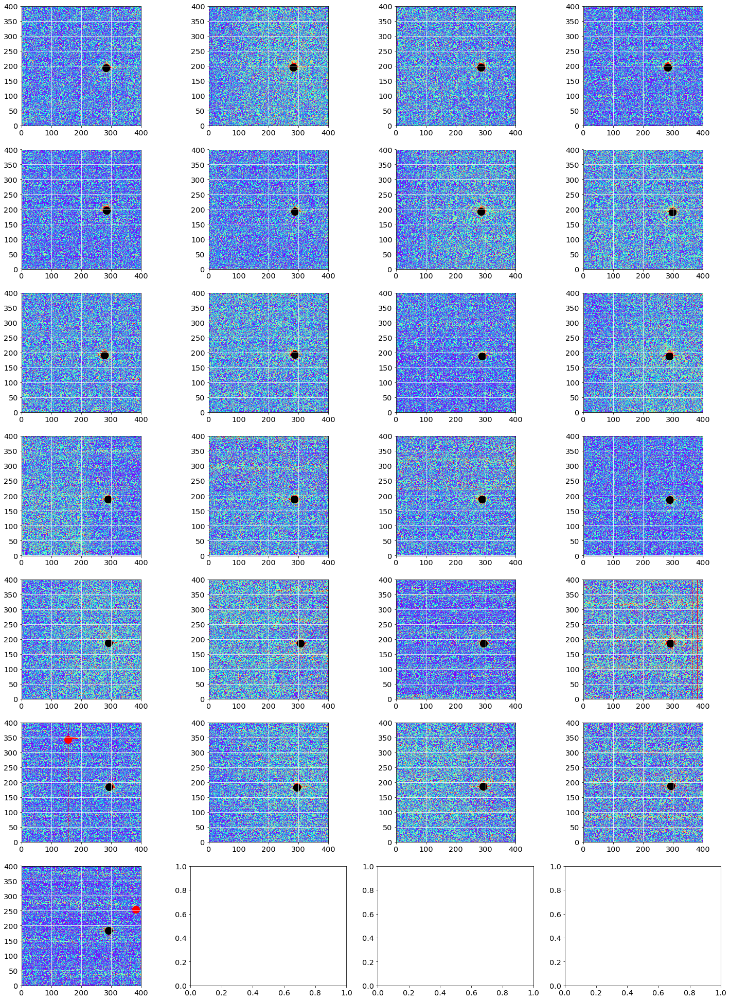

In [47]:
textfilename = '../../ana_10jun17/ScanThor300_FGB37/cut_fitsimages/star_centroids.txt'
guess = (np.loadtxt(textfilename)).astype(int)

img_mean,img_median,img_std,x_star,y_star=ComputeStatImagesWithGuess(all_images,guess)

### Central star position

In [48]:
# Default position
print x_star
print y_star
print guess.T
x0 = x_star[len(x_star)/2]
y0 = y_star[len(y_star)/2]

[ 409  745 1082 1417 1756  411  747 1097 1420 1756  411  748 1084 1419 1755
  411  747 1099 1420 1756  411  748 1081 1419 1753]
[ 330  330  329  330  330  663  662  661  661  662  995  995  994  994  994
 1332 1331 1330 1330 1330 1666 1665 1666 1666 1665]
[[ 337  335  335  335  334  672  671  671  671  670 1008 1007 1007 1006
  1006 1346 1345 1345 1345 1345 1682 1682 1681 1679 1681]
 [ 327  663  998 1335 1672  324  662  999 1343 1669  324  660  996 1333
  1668  322  656  993 1328 1665  318  654  989 1326 1663]]


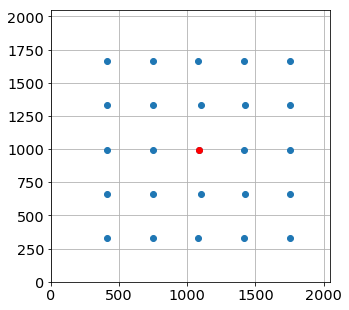

In [49]:
img_size=all_images[0].shape
plt.figure(figsize=(5,5))
plt.plot(x_star,y_star,'o')
plt.plot(x0,y0,'ro')
plt.xlim(0,img_size[1])
plt.ylim(0,img_size[0])
plt.grid(True)

### Cut the image

In [50]:
DeltaY=100
DeltaX=600

In [51]:
#%%cython

import numpy as np
import matplotlib.pyplot as plt
from photutils import CircularAperture
import os

def ShowCenterImages(all_images,all_titles,object_name,dir_top_images):
    """
    ShowCenterImages: Show the raw images without background subtraction
    ==============
    """
    NBIMAGES=len(all_images)
    NBIMGPERLROW = 2
    MAXIMGROW=int(NBIMAGES/NBIMGPERLROW)+1
    
    #global dir_top_images
    
    croped_images = []
    f, axarr = plt.subplots(MAXIMGROW,NBIMGPERLROW,figsize=(25,5*MAXIMGROW))
    for index in np.arange(0,NBIMAGES):
        ix=index%NBIMGPERLROW
        iy=index/NBIMGPERLROW
        x0 = x_star[index]
        y0 = y_star[index]
       
        #image_cut=all_images[index][y0-200:y0+200,x0-200,y0+200]
        theimage=all_images[index]
        #image_cut=theimage[y0-DeltaY:y0+DeltaY,x0-DeltaX:x0+DeltaX]
        image_cut=np.copy(theimage[y0-DeltaY:y0+DeltaY,:])
        croped_images.append(image_cut)
        #aperture=CircularAperture([positions_central[index]], r=100.)
        im=axarr[iy,ix].imshow(image_cut,cmap='rainbow',vmin=0,vmax=1000,aspect='auto',origin='lower',interpolation='None')
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(color='white', ls='solid')
        #aperture.plot(color='red', lw=5.)
    title='Cut Images of {}'.format(object_name)
    plt.suptitle(title,size=16) 
    
    figfilename=os.path.join(dir_top_images,'cut_images.pdf')
    plt.savefig(figfilename)   
    
    
    return croped_images

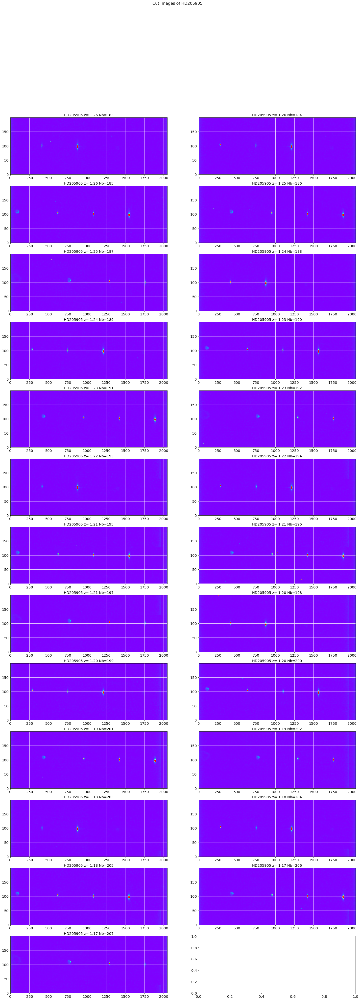

In [52]:
images_cut=ShowCenterImages(all_images,all_titles,object_name,dir_top_images)

#### Example of cut image
-------------------------

In [53]:
index=0
data=np.copy(images_cut[index])
w=20
ws=80
data[:,DeltaX-ws:DeltaX+ws]=0

In [54]:
yprofile=np.sum(data,axis=1)
xprofile=np.sum(data,axis=0)

In [55]:
y_center=np.where(yprofile==yprofile.max())[0][0]
print y_center

97


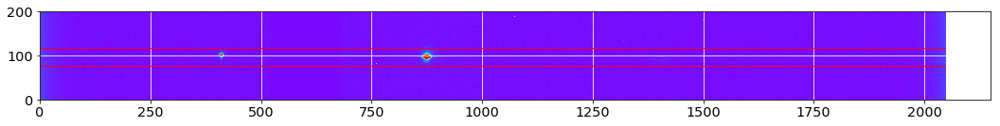

In [56]:
plt.figure(figsize=(18,18))
plt.imshow(data,vmin=-10,vmax=800,origin='lower',cmap='rainbow',interpolation='None')
plt.plot([0,data.shape[1]],[y_center-w,y_center-w],'r-',lw=1)
plt.plot([0,data.shape[1]],[y_center+w,y_center+w],'r-',lw=1)
plt.grid(color='white', ls='solid')
plt.show()
figfilename=os.path.join(dir_top_images,'cutimages_sample.pdf')
plt.savefig(figfilename)   

### prepare outputfilename

In [57]:
newfullfilenames=[]
for idx,file in np.ndenumerate(sorted_files):
    
    short_infilename=file.split("/")[3]
    print short_infilename
    short_partfilename=re.findall('^trim_(.*)',short_infilename)
    short_outfilename='cutimg_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)

trim_20170609_183.fits
trim_20170609_184.fits
trim_20170609_185.fits
trim_20170609_186.fits
trim_20170609_187.fits
trim_20170609_188.fits
trim_20170609_189.fits
trim_20170609_190.fits
trim_20170609_191.fits
trim_20170609_192.fits
trim_20170609_193.fits
trim_20170609_194.fits
trim_20170609_195.fits
trim_20170609_196.fits
trim_20170609_197.fits
trim_20170609_198.fits
trim_20170609_199.fits
trim_20170609_200.fits
trim_20170609_201.fits
trim_20170609_202.fits
trim_20170609_203.fits
trim_20170609_204.fits
trim_20170609_205.fits
trim_20170609_206.fits
trim_20170609_207.fits


### Save outputfilename

In [58]:
for idx,file in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=images_cut[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(file,overwrite=True)
textfilename=os.path.join(outputdir,'star_centroids.txt')
print textfilename
np.savetxt(textfilename,np.array([y_star, x_star]).T,header="y_star x_star",fmt='%d')

./cut_fitsimages/star_centroids.txt


In [59]:
for idx,file in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=images_cut[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(file,overwrite=True)

In [60]:
!ls -l cut_fitsimages/*

-rw-r--r--  1 jneveu  staff  3288960 11 jui 09:02 cut_fitsimages/cutimg_20170609_183.fits
-rw-r--r--  1 jneveu  staff  3288960 11 jui 09:02 cut_fitsimages/cutimg_20170609_184.fits
-rw-r--r--  1 jneveu  staff  3288960 11 jui 09:02 cut_fitsimages/cutimg_20170609_185.fits
-rw-r--r--  1 jneveu  staff  3288960 11 jui 09:02 cut_fitsimages/cutimg_20170609_186.fits
-rw-r--r--  1 jneveu  staff  3288960 11 jui 09:02 cut_fitsimages/cutimg_20170609_187.fits
-rw-r--r--  1 jneveu  staff  3288960 11 jui 09:02 cut_fitsimages/cutimg_20170609_188.fits
-rw-r--r--  1 jneveu  staff  3288960 11 jui 09:02 cut_fitsimages/cutimg_20170609_189.fits
-rw-r--r--  1 jneveu  staff  3288960 11 jui 09:02 cut_fitsimages/cutimg_20170609_190.fits
-rw-r--r--  1 jneveu  staff  3288960 11 jui 09:02 cut_fitsimages/cutimg_20170609_191.fits
-rw-r--r--  1 jneveu  staff  3288960 11 jui 09:02 cut_fitsimages/cutimg_20170609_192.fits
-rw-r--r--  1 jneveu  staff  3288960 11 jui 09:02 cut_fitsimages/cutimg_20170609_193.fits
-rw-r--r--